In [1]:
from pathlib import Path

import pandas as pd
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
import matplotlib.pylab as plt
import numpy as np
import statsmodels.api as sm
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import dmba
from dmba import plotDecisionTree, classificationSummary, regressionSummary
import seaborn as sns
from dmba import classificationSummary, gainsChart, liftChart
from dmba.metric import AIC_score
%matplotlib inline


In [2]:
file_path = 'NextGenAI.xlsx'

# Read the specific sheet into a DataFrame
plant_df = pd.read_excel(file_path, sheet_name='Training Data 20000') # loading of whole dataset 
test_df= pd.read_excel(file_path, sheet_name='Test Data for LR and DT') # test data 
type_df= pd.read_excel(file_path, sheet_name='Data for Visualization')  # visualization data 

# Display the first few rows of the DataFrame
#print(plant_df.head())
plant_df.shape 
#type_df.shape


(20000, 17)

In [3]:
teste_df=test_df.copy()
o_plant_df=plant_df.copy()
a_plant_df=plant_df.copy()

In [4]:
# Display current column names
print("Original test Column Names:", teste_df.columns.tolist())

# Clean the column names
teste_df.columns = (
    teste_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned test Column Names:", teste_df.columns.tolist())

Original test Column Names: ['ATN', 'DURATION', 'C-B', 'MONTH', 'TYPE_ALARM', 'Flow', 'Level', 'Temperature', 'Others', 'Pressure', 'H', 'Hour 0-6', 'Hour 7-12', 'Hour 13-18', 'Hour 19-24', 'WEEK', '1st Week', '2nd Week', '3rd Week', '4th Week', 'Unnamed: 20', 'Unnamed: 21']
Cleaned test Column Names: ['atn', 'duration', 'c_b', 'month', 'type_alarm', 'flow', 'level', 'temperature', 'others', 'pressure', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week', 'unnamed__20', 'unnamed__21']


#cleaning entire dataset columns

In [5]:
# Display current column names
print("Original Column Names:", plant_df.columns.tolist())

# Clean the column names
plant_df.columns = (
    plant_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", plant_df.columns.tolist())


Original Column Names: ['C-B', 'ATN', 'DURATION', 'MONTH', 'Flow', 'Level', 'Pressure', 'Temperature', 'Others', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18', 'Hour:19-24', '1st Week', '2nd week', '3rd week', '4th week']
Cleaned Column Names: ['c_b', 'atn', 'duration', 'month', 'flow', 'level', 'pressure', 'temperature', 'others', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [6]:
print(type_df.columns)

Index(['ATN', 'Severity', 'BOILER ALARM ', 'TYPE '], dtype='object')


In [7]:
#focus on boiler alarm 'Evap 1', 'Evap 2', 'Evap 3', 'Evap 4', 'Evap 1 & 2', 'Evap 3 & 4' alarm types alone alone

In [8]:
# Define the specific groupings you are interested in
target_groupings = ['Evap 1', 'Evap 2', 'Evap 3', 'Evap 4', 'Evap 1 & 2', 'Evap 3 & 4']

# Filter the DataFrame for the target groupings using 'isin' method
filtered_df = type_df[type_df['BOILER ALARM '].isin(target_groupings)]
print(filtered_df.columns)
# Extract unique Type values
unique_tagnames = filtered_df['ATN'].unique()

# Convert to list (if needed)
unique_tagnames_list = list(unique_tagnames)

# Output the unique alarm type names
len(unique_tagnames_list)

# Convert the unique_alaram_typenames_list to a set for faster lookup
unique_tagnames_set = set(unique_tagnames_list)
print(len(unique_tagnames_set))
# Filter plant_df based on matching 'so' values with the unique alaram type names
boiler_df = plant_df[plant_df['atn'].isin(unique_tagnames_set)]

# Count the number of matching rows
matching_rows_count =boiler_df.shape[0]

# Output the count of matching rows
print(f"Number of matching rows in 'plant_df': {matching_rows_count}")
print(boiler_df)

Index(['ATN', 'Severity', 'BOILER ALARM ', 'TYPE '], dtype='object')
110
Number of matching rows in 'plant_df': 6054
       c_b        atn  duration  month  flow  level  pressure  temperature  \
1002     1  FAL-3452A         4     11     1      0         0            0   
1003     1  FAL-3452A         4     12     1      0         0            0   
1004     1  FAL-3452A         4     12     1      0         0            0   
1005     0  FAL-3452A         4     11     1      0         0            0   
1006     0   FAL-3480         4      3     1      0         0            0   
...    ...        ...       ...    ...   ...    ...       ...          ...   
19990    0   TAH-3371      2476     11     0      0         0            1   
19991    0   TAL-3046      2476      8     0      0         0            1   
19992    0   FAL-3480      2478      5     1      0         0            0   
19995    0  LAL-3801C      2485      5     0      1         0            0   
19996    0  LAL-3801C    

In [9]:
teste_df.columns

Index(['atn', 'duration', 'c_b', 'month', 'type_alarm', 'flow', 'level',
       'temperature', 'others', 'pressure', 'h', 'hour_0_6', 'hour_7_12',
       'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week',
       '4th_week', 'unnamed__20', 'unnamed__21'],
      dtype='object')

In [10]:
# Filter plant_df based on matching 'atn' values with the unique tag names
teste_filter_df = teste_df[teste_df['atn'].isin(unique_tagnames_set)]

# Count the number of matching rows
matching_rows_count =teste_filter_df.shape[0]

# Output the count of matching rows
print(f"Number of matching rows in 'plant_df': {matching_rows_count}")
print(teste_filter_df)

Number of matching rows in 'plant_df': 44
             atn  duration  c_b  month type_alarm  flow  level  temperature  \
163    VAH-3386B         5    0      4     Others     0      0            0   
164   VAHH-3386A         5    0     12     Others     0      0            0   
165   VAHH-3386A         5    0     12     Others     0      0            0   
179    VAH-3049A         6    0      9     Others     0      0            0   
182    VAH-3386B         6    0      9     Others     0      0            0   
190    VAH-3386A         7    0     12     Others     0      0            0   
198   VAHH-3386A         8    0     11     Others     0      0            0   
199   VAHH-3386B         8    0     12     Others     0      0            0   
209    VAH-3386B         9    0     12     Others     0      0            0   
278    VAH-3386A        10    0     11     Others     0      0            0   
415    VAH-3049A         5    0     10     Others     0      0            0   
416    VAH

In [11]:
columns_to_drop = ['atn','h', 'hour_0_6', 'type_alarm', 'flow','week', '1st_week', 'unnamed__21', 'unnamed__20']

# Drop the specified columns
teste_df = teste_df.drop(columns=columns_to_drop)

# Check the resulting DataFrame
print(teste_df.head())
teste_df.shape

   duration  c_b  month  level  temperature  others  pressure  hour_7_12  \
0         1    0      4      0            0       0         1          0   
1         1    0      4      0            0       0         1          0   
2         1    0      4      0            0       0         1          0   
3         1    0      4      0            0       0         1          0   
4         1    0      4      0            0       0         1          0   

   hour_13_18  hour_19_24  2nd_week  3rd_week  4th_week  
0           0           1         0         1         0  
1           0           1         0         1         0  
2           0           1         0         1         0  
3           0           1         0         1         0  
4           0           1         0         1         0  


(2000, 13)

In [12]:
# Count the number of rows where 'c_b' column value is 1
matching_chb_rows_count = boiler_df[boiler_df['c_b'] == 1].shape[0]

# Output the count of rows with 'c_b' value 1
print(f"Number of rows with 'chb' value 1: {matching_chb_rows_count}")

Number of rows with 'chb' value 1: 1569


In [13]:
# Display current column names
print("Original Column Names:", boiler_df.columns.tolist())

# Clean the column names
boiler_df.columns = (
    boiler_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", boiler_df.columns.tolist())

Original Column Names: ['c_b', 'atn', 'duration', 'month', 'flow', 'level', 'pressure', 'temperature', 'others', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', '1st_week', '2nd_week', '3rd_week', '4th_week']
Cleaned Column Names: ['c_b', 'atn', 'duration', 'month', 'flow', 'level', 'pressure', 'temperature', 'others', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [14]:
columns_to_drop = [ 'hour_0_6', 'flow', '1st_week']

# Drop the specified columns
boiler_df = boiler_df.drop(columns=columns_to_drop)
boiler_df = boiler_df.reset_index(drop=True)  # Reset index of boiler_df if necessary

# Check the resulting DataFrame
print(boiler_df.head())

   c_b        atn  duration  month  level  pressure  temperature  others  \
0    1  FAL-3452A         4     11      0         0            0       0   
1    1  FAL-3452A         4     12      0         0            0       0   
2    1  FAL-3452A         4     12      0         0            0       0   
3    0  FAL-3452A         4     11      0         0            0       0   
4    0   FAL-3480         4      3      0         0            0       0   

   hour_7_12  hour_13_18  hour_19_24  2nd_week  3rd_week  4th_week  
0          0           0           1         0         0         0  
1          0           1           0         0         1         0  
2          0           1           0         0         1         0  
3          1           0           0         0         0         0  
4          0           0           1         0         0         1  


In [15]:
boiler_df.columns

Index(['c_b', 'atn', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week'],
      dtype='object')

In [16]:
#Partition the data into train and valid. Make sure you set seed
# random_state is set to a defined value to get the same partitions when re-running the code
trainData= boiler_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData =boiler_df.drop(trainData.index)

In [17]:
trainData.head()

,c_b,atn,duration,month,level,pressure,temperature,others,hour_7_12,hour_13_18,hour_19_24,2nd_week,3rd_week,4th_week
1056,1,PAL-3356,5,4,0,1,0,0,0,0,1,1,0,0
301,1,FAL-3452A,5,11,0,0,0,0,1,0,0,0,0,0
2420,1,PAL-3372,11,6,0,1,0,0,1,0,0,1,0,0
3510,0,LAHH-3350C,37,6,1,0,0,0,1,0,0,1,0,0
3169,0,LAH-3350,25,6,1,0,0,0,0,0,1,1,0,0


In [18]:
trainData.index

Index([1056,  301, 2420, 3510, 3169, 4299,  234, 2720, 5720, 5438,
       ...
       3934, 1688, 1347, 4049, 1708, 4282,  160,  670, 1266,  353],
      dtype='int64', length=3632)

In [19]:
trainData.columns

Index(['c_b', 'atn', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week'],
      dtype='object')

In [20]:
validData.index

Index([   0,    2,    8,   14,   15,   18,   20,   23,   24,   27,
       ...
       6016, 6020, 6026, 6028, 6031, 6034, 6037, 6045, 6047, 6051],
      dtype='int64', length=2422)

In [21]:
print(trainData[['duration', 'month']].isnull().sum())  # Check for missing values in 'atd' and 'm'


duration    0
month       0
dtype: int64


In [22]:
#normalization 
scaler = preprocessing.StandardScaler()
scaler.fit(trainData[['duration', 'month', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']])  # Note the use of an array of column names

# Transform the full dataset
boilerNorm = pd.concat([pd.DataFrame(scaler.transform(boiler_df[['duration', 'month','level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']]), columns=['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week']),boiler_df[['c_b']]], axis=1)
boilerNorm.columns
print(boilerNorm.isnull().sum())  # Check for missing values after scaling

trainNorm = boilerNorm.iloc[trainData.index]
# #Similarly, get the valid one as well
validNorm = boilerNorm.iloc[validData.index]
# Transform the test dataset boiler

testNorme= pd.concat([pd.DataFrame(scaler.transform(teste_df[['duration', 'month','level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']]), columns=['zduration', 'zmonth','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week']), teste_df[['c_b']]], axis=1)

zduration       0
zmonth          0
zlevel          0
zpressure       0
ztemperature    0
zothers         0
zhour_7_12      0
zhour_13_18     0
zhour_19_24     0
z2nd_week       0
z3rd_week       0
z4th_week       0
c_b             0
dtype: int64


In [23]:
trainNorm.head()

,zduration,zmonth,zlevel,zpressure,ztemperature,zothers,zhour_7_12,zhour_13_18,zhour_19_24,z2nd_week,z3rd_week,z4th_week,c_b
1056,-0.416851,-0.811753,-0.737711,2.669322,-0.507561,-0.270128,-0.604494,-0.664281,2.034011,1.641588,-0.632577,-0.655684,1
301,-0.416851,1.054589,-0.737711,-0.374627,-0.507561,-0.270128,1.654275,-0.664281,-0.491640,-0.609166,-0.632577,-0.655684,1
2420,-0.401684,-0.278512,-0.737711,2.669322,-0.507561,-0.270128,1.654275,-0.664281,-0.491640,1.641588,-0.632577,-0.655684,1
3510,-0.335959,-0.278512,1.355544,-0.374627,-0.507561,-0.270128,1.654275,-0.664281,-0.491640,1.641588,-0.632577,-0.655684,0
3169,-0.366294,-0.278512,1.355544,-0.374627,-0.507561,-0.270128,-0.604494,-0.664281,2.034011,1.641588,-0.632577,-0.655684,0


In [24]:
knn = KNeighborsClassifier(n_neighbors=3).fit(trainNorm[['zduration', 'zmonth','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week']], trainNorm['c_b'])

In [25]:
valid_pred=knn.predict(validNorm[['zduration', 'zmonth' ,'zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week']])

In [26]:
accuracy_score(validNorm['c_b'] ,valid_pred)

0.898018166804294

In [27]:
cm = confusion_matrix(validNorm['c_b'],valid_pred)

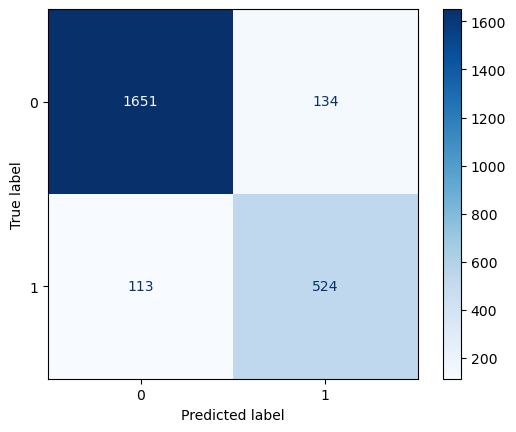

In [28]:
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_)
cm_display.plot(cmap='Blues')


In [29]:
FN = cm[1, 0]  # False Negatives
TP = cm[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")


False Negative Rate: 0.18


In [30]:
#knn best K 
train_X = trainNorm[['zduration', 'zmonth' , 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']]
train_y = trainNorm['c_b']
valid_X = validNorm[['zduration', 'zmonth' , 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']]
valid_y = validNorm['c_b']
results = []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 7):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    accuracy = accuracy_score(valid_y, knn.predict(valid_X))
    results.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results = pd.DataFrame(results)

# Print the results and the best k value
print(results)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

   k  accuracy
0  1  0.875310
1  2  0.882329
2  3  0.898018
3  4  0.895128
4  5  0.897192
5  6  0.901321
Max Accuracy: 0.9013212221304707 at k = 6


In [31]:
knn1 = KNeighborsClassifier(n_neighbors=6).fit(trainNorm[['zduration', 'zmonth' , 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']], trainNorm['c_b'])

In [32]:
valid_pred1=knn1.predict(validNorm[['zduration', 'zmonth' , 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']])

In [33]:
accuracy_score(validNorm['c_b'] ,valid_pred1)

0.9013212221304707

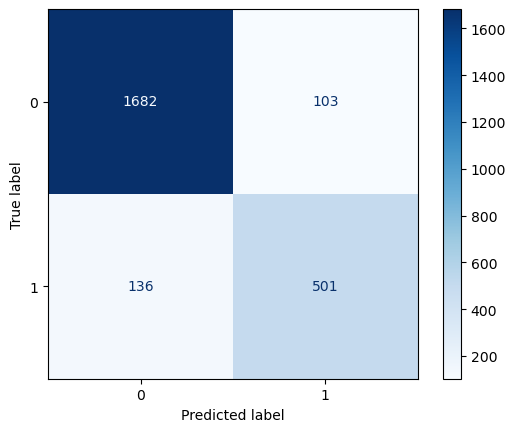

In [34]:
cm_e_VALID= confusion_matrix(validNorm['c_b'] ,valid_pred1)
cm_display_eVALID= ConfusionMatrixDisplay(confusion_matrix=cm_e_VALID, display_labels=knn1.classes_)
cm_display_eVALID.plot(cmap='Blues')

In [35]:
FN = cm_e_VALID[1, 0]  # False Negatives
TP = cm_e_VALID[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")


False Negative Rate: 0.21


In [36]:
test_pred_e=knn1.predict(testNorme[['zduration', 'zmonth' , 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']])

In [37]:
accuracy_score(testNorme['c_b'] ,test_pred_e)


0.739

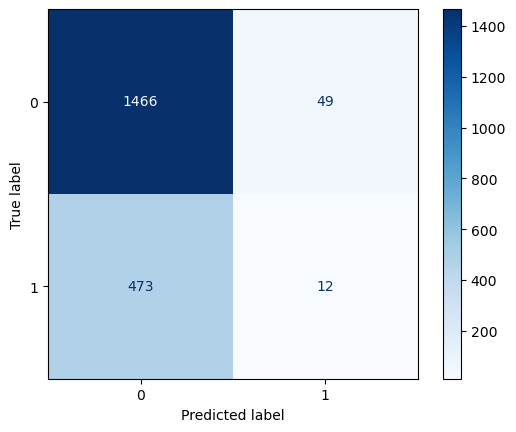

In [38]:
cm_e_full= confusion_matrix(testNorme['c_b'] ,test_pred_e)
cm_display_efull= ConfusionMatrixDisplay(confusion_matrix=cm_e_full, display_labels=knn1.classes_)
cm_display_efull.plot(cmap='Blues')

In [39]:
# print(teste_filter_df)

In [40]:
# columns_to_drop = ['s_no','so','h', 'hour_0_6', 'alarm_tag_type', 'flow','d', '1st_week','z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']

# # Drop the specified columns
# teste_filter_df =teste_filter_df.drop(columns=columns_to_drop)

# # Check the resulting DataFrame
# print(teste_filter_df.head())
# teste_filter_df.shape

In [41]:

# teste_filter_df= teste_filter_df.reset_index(drop=True)
# # Check the resulting DataFrame
# print(teste_filter_df.head())
# teste_filter_df.shape

In [42]:
# testNorme_filter= pd.concat([pd.DataFrame(scaler.transform(teste_filter_df[['atd', 'm']]), 
#                                     columns=['zatd', 'zm']),
#                       teste_filter_df[['chb', 'level', 'pressure', 'temperature', 'others',
#        'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
#        '4th_week']]], axis=1)

In [43]:
#print(testNorme_filter.head())

In [44]:
# test_pred_e_filter=knn1.predict(testNorme_filter[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
#        'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
#        '4th_week']])

In [45]:
# accuracy_score(testNorme_filter['chb'] ,test_pred_e_filter)

In [46]:
# cm_e_filter= confusion_matrix(testNorme_filter['chb'] ,test_pred_e_filter)
# cm_display_efilter= ConfusionMatrixDisplay(confusion_matrix=cm_e_filter, display_labels=knn1.classes_)
# cm_display_efilter.plot(cmap='Blues')

In [47]:
# # Perform 5-fold cross-validation

# scores = cross_val_score(knn1,boilerNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
#        'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
#        '4th_week']], boilerNorm['chb'], cv=10)

# print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
# print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
# print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

In [48]:
plant_df.columns

Index(['c_b', 'atn', 'duration', 'month', 'flow', 'level', 'pressure',
       'temperature', 'others', 'hour_0_6', 'hour_7_12', 'hour_13_18',
       'hour_19_24', '1st_week', '2nd_week', '3rd_week', '4th_week'],
      dtype='object')

taking the top 10 common chattering alarm tags . feature engineering . renaming other alarm tags as others 

In [49]:
# Table 1: Count of Unique Values in 'atn' Column and Their Occurrences
table_1 = plant_df['atn'].value_counts().reset_index()
table_1.columns = ['atn', 'count']

# Table 2: Count and Percentage of 'chb' = 1 for Each Unique 'atn'
table_2 = plant_df.groupby('atn').agg(
    chb_1_count=('c_b', lambda x: (x == 1).sum()),  # Count of 'chb' == 1 for each 'atn'
    chb_1_percentage=('c_b', lambda x: (x == 1).mean() * 100)  # Percentage of 'chb' == 1 for each 'atn'
).reset_index()
# Merge table_1 and table_2 to get a complete view
final_table = pd.merge(table_1, table_2, on='atn')
# Merge table_1 and table_2 to get a complete view
final_table_sorted = final_table.sort_values(by='chb_1_count', ascending=False).reset_index(drop=True)

# Display the sorted final table
print("Sorted Final Table: Counts and Percentages of 'chb' = 1 for Each Unique 'atn'")
print(final_table_sorted.head(50))

Sorted Final Table: Counts and Percentages of 'chb' = 1 for Each Unique 'atn'
           atn  count  chb_1_count  chb_1_percentage
0     PAH-3200    698          463         66.332378
1    XASS-3140    517          372         71.953578
2   FALL-3452A    531          343         64.595104
3    FAL-3452A    516          331         64.147287
4    PDAH-3190    449          268         59.688196
5     FAL-3020    262          217         82.824427
6    LDAH-3708    214          197         92.056075
7     PAL-3390    202          157         77.722772
8    PDIT-3091    158          154         97.468354
9     PAL-3356    148          134         90.540541
10   PDAH-3094    141          127         90.070922
11    PIT-3029    106           93         87.735849
12    LIT-3503    100           90         90.000000
13    TAH-3038    435           80         18.390805
14    FAL-3480    347           79         22.766571
15   LAHH-3503     88           72         81.818182
16     XA-3486     90

In [50]:
# Create a new table where chb_1_percentage is above 55
filtered_table = final_table_sorted[final_table_sorted['chb_1_percentage'] > 55]
chb_1_count_sum = filtered_table.head(5)['count'].sum()
# Display the filtered table
print("Filtered Table: chb_1_percentage above 55")
print(filtered_table)
print(chb_1_count_sum)

Filtered Table: chb_1_percentage above 55
            atn  count  chb_1_count  chb_1_percentage
0      PAH-3200    698          463         66.332378
1     XASS-3140    517          372         71.953578
2    FALL-3452A    531          343         64.595104
3     FAL-3452A    516          331         64.147287
4     PDAH-3190    449          268         59.688196
5      FAL-3020    262          217         82.824427
6     LDAH-3708    214          197         92.056075
7      PAL-3390    202          157         77.722772
8     PDIT-3091    158          154         97.468354
9      PAL-3356    148          134         90.540541
10    PDAH-3094    141          127         90.070922
11     PIT-3029    106           93         87.735849
12     LIT-3503    100           90         90.000000
15    LAHH-3503     88           72         81.818182
16      XA-3486     90           70         77.777778
17     PAL-3372     67           64         95.522388
18     FSL-3511     71           63     

In [51]:
plant_df.columns

Index(['c_b', 'atn', 'duration', 'month', 'flow', 'level', 'pressure',
       'temperature', 'others', 'hour_0_6', 'hour_7_12', 'hour_13_18',
       'hour_19_24', '1st_week', '2nd_week', '3rd_week', '4th_week'],
      dtype='object')

In [52]:
# Define the list of desired 'atn' values
desired_atn_values = ['PAH-3200', 'XASS-3140', 'FALL-3452A', 'FAL-3452A', 
                     'PDAH-3190', 'FAL-3020', 'LDAH-3708', 
                     'PAL-3390', 'PDIT-3091', 'PAL-3356']

# Update 'atn' column: Keep desired values, rename others as 'Other'
plant_df['atn'] = plant_df['atn'].apply(lambda x: x if x in desired_atn_values else 'Other_alarm')


In [53]:
print(plant_df['atn'])

0        Other_alarm
1        Other_alarm
2        Other_alarm
3        Other_alarm
4        Other_alarm
            ...     
19995    Other_alarm
19996    Other_alarm
19997    Other_alarm
19998    Other_alarm
19999    Other_alarm
Name: atn, Length: 20000, dtype: object


In [54]:
# Count the number of rows with 'Other' in the 'atn' column
other_count = plant_df[plant_df['atn'] == 'Other_alarm'].shape[0]

print(f"Number of rows with 'Other' as the value in the 'atn' column: {other_count}")


Number of rows with 'Other' as the value in the 'atn' column: 16305


In [55]:
print(plant_df.head(20))
print(plant_df.columns)

    c_b          atn  duration  month  flow  level  pressure  temperature  \
0     0  Other_alarm         0      6     0      0         0            0   
1     0  Other_alarm         0      7     0      0         0            0   
2     0  Other_alarm         0      7     0      0         0            0   
3     0  Other_alarm         0     10     0      0         0            0   
4     0  Other_alarm         0     10     0      0         0            0   
5     0  Other_alarm         0      6     0      0         0            0   
6     0  Other_alarm         1     12     0      0         0            0   
7     0  Other_alarm         1     12     0      0         0            0   
8     0  Other_alarm         1     12     0      0         0            0   
9     0  Other_alarm         1     12     0      0         0            0   
10    0  Other_alarm         1     12     0      0         0            0   
11    1  Other_alarm         1     12     0      0         0            0   

In [56]:
columns_to_drop= ['hour_0_6', 'flow', '1st_week']

# Drop the specified columns
plant_df = plant_df.drop(columns=columns_to_drop)

# Check the resulting DataFrame
print(plant_df.head())

   c_b          atn  duration  month  level  pressure  temperature  others  \
0    0  Other_alarm         0      6      0         0            0       1   
1    0  Other_alarm         0      7      0         0            0       1   
2    0  Other_alarm         0      7      0         0            0       1   
3    0  Other_alarm         0     10      0         0            0       1   
4    0  Other_alarm         0     10      0         0            0       1   

   hour_7_12  hour_13_18  hour_19_24  2nd_week  3rd_week  4th_week  
0          1           0           0         0         0         1  
1          0           1           0         1         0         0  
2          0           1           0         1         0         0  
3          0           1           0         1         0         0  
4          1           0           0         1         0         0  


In [57]:
#convert to dummy variables
plant_df = pd.get_dummies(plant_df, prefix_sep='_',dtype='int', drop_first=False)
plant_df.columns

Index(['c_b', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_FAL-3020', 'atn_FAL-3452A',
       'atn_FALL-3452A', 'atn_LDAH-3708', 'atn_Other_alarm', 'atn_PAH-3200',
       'atn_PAL-3356', 'atn_PAL-3390', 'atn_PDAH-3190', 'atn_PDIT-3091',
       'atn_XASS-3140'],
      dtype='object')

In [58]:
if 'atn_Other_alarm' in plant_df.columns:
    plant_df.drop(columns=['atn_Other_alarm'], inplace=True)
plant_df.columns

Index(['c_b', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_FAL-3020', 'atn_FAL-3452A',
       'atn_FALL-3452A', 'atn_LDAH-3708', 'atn_PAH-3200', 'atn_PAL-3356',
       'atn_PAL-3390', 'atn_PDAH-3190', 'atn_PDIT-3091', 'atn_XASS-3140'],
      dtype='object')

In [59]:
plant_df.shape

(20000, 23)

In [60]:
#Partition the data into train and valid. Make sure you set seed
# random_state is set to a defined value to get the same partitions when re-running the code
trainData1= plant_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData1=plant_df.drop(trainData1.index)

In [61]:
trainData1.columns

Index(['c_b', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_FAL-3020', 'atn_FAL-3452A',
       'atn_FALL-3452A', 'atn_LDAH-3708', 'atn_PAH-3200', 'atn_PAL-3356',
       'atn_PAL-3390', 'atn_PDAH-3190', 'atn_PDIT-3091', 'atn_XASS-3140'],
      dtype='object')

In [62]:
validData1.shape

(8000, 23)

In [63]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData1[['duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_FAL-3020', 'atn_FAL-3452A',
       'atn_FALL-3452A', 'atn_LDAH-3708', 'atn_PAH-3200', 'atn_PAL-3356',
       'atn_PAL-3390', 'atn_PDAH-3190', 'atn_PDIT-3091', 'atn_XASS-3140']])  # Note the use of an array of column names

# Transform the full dataset
plantNorm = pd.concat([pd.DataFrame(scaler.transform(plant_df[[ 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_FAL-3020', 'atn_FAL-3452A',
       'atn_FALL-3452A', 'atn_LDAH-3708', 'atn_PAH-3200', 'atn_PAL-3356',
       'atn_PAL-3390', 'atn_PDAH-3190', 'atn_PDIT-3091', 'atn_XASS-3140']]), 
                                    columns=['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature',
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week',
'z3rd_week', 'z4th_week', 'zatn_FAL-3020', 'zatn_FAL-3452A',
'zatn_FALL-3452A', 'zatn_LDAH-3708', 'zatn_PAH-3200', 'zatn_PAL-3356',
'zatn_PAL-3390', 'zatn_PDAH-3190', 'zatn_PDIT-3091', 'zatn_XASS-3140'
]),
                       plant_df[['c_b']]], axis=1)
trainNorm1= plantNorm.iloc[trainData1.index]
#Similarly, get the valid one as well
validNorm1= plantNorm.iloc[validData1.index]

In [64]:
trainNorm1.shape
#trainNorm.columns

(12000, 23)

In [65]:
knn_t10= KNeighborsClassifier(n_neighbors=3).fit(trainNorm1[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature',
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week',
'z3rd_week', 'z4th_week', 'zatn_FAL-3020', 'zatn_FAL-3452A',
'zatn_FALL-3452A', 'zatn_LDAH-3708', 'zatn_PAH-3200', 'zatn_PAL-3356',
'zatn_PAL-3390', 'zatn_PDAH-3190', 'zatn_PDIT-3091', 'zatn_XASS-3140']], trainNorm1['c_b'])

In [66]:
valid_pred_t10=knn_t10.predict(validNorm1[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature',
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week',
'z3rd_week', 'z4th_week', 'zatn_FAL-3020', 'zatn_FAL-3452A',
'zatn_FALL-3452A', 'zatn_LDAH-3708', 'zatn_PAH-3200', 'zatn_PAL-3356',
'zatn_PAL-3390', 'zatn_PDAH-3190', 'zatn_PDIT-3091', 'zatn_XASS-3140']])

In [67]:
accuracy_score(validNorm1['c_b'] ,valid_pred_t10)

0.904125

In [68]:
validNorm1.shape

(8000, 23)

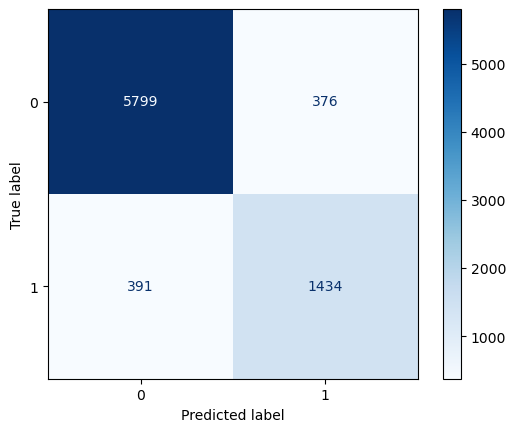

In [69]:
cm_o_valid= confusion_matrix(validNorm1['c_b'] ,valid_pred_t10)
cm_display_oVALID= ConfusionMatrixDisplay(confusion_matrix=cm_o_valid, display_labels=knn_t10.classes_)
cm_display_oVALID.plot(cmap='Blues')

In [70]:
FN = cm_o_valid[1, 0]  # False Negatives
TP = cm_o_valid[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")

False Negative Rate: 0.21


In [71]:
#test
train_X_t10 = trainNorm1[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature',
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week',
'z3rd_week', 'z4th_week', 'zatn_FAL-3020', 'zatn_FAL-3452A',
'zatn_FALL-3452A', 'zatn_LDAH-3708', 'zatn_PAH-3200', 'zatn_PAL-3356',
'zatn_PAL-3390', 'zatn_PDAH-3190', 'zatn_PDIT-3091', 'zatn_XASS-3140']]
train_y_t10= trainNorm1['c_b']
valid_X_t10= validNorm1[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature',
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week',
'z3rd_week', 'z4th_week', 'zatn_FAL-3020', 'zatn_FAL-3452A',
'zatn_FALL-3452A', 'zatn_LDAH-3708', 'zatn_PAH-3200', 'zatn_PAL-3356',
'zatn_PAL-3390', 'zatn_PDAH-3190', 'zatn_PDIT-3091', 'zatn_XASS-3140']]
valid_y_t10= validNorm1['c_b']
results_t10= []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 5):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X_t10, train_y_t10)
    accuracy = accuracy_score(valid_y_t10, knn.predict(valid_X_t10))
    results_t10.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results_t10= pd.DataFrame(results_t10)

# Print the results and the best k value
print(results_t10)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

   k  accuracy
0  1  0.891500
1  2  0.896875
2  3  0.904125
3  4  0.905000
Max Accuracy: 0.905 at k = 4


In [72]:
knn_t10_k= KNeighborsClassifier(n_neighbors=4).fit(trainNorm1[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature',
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week',
'z3rd_week', 'z4th_week', 'zatn_FAL-3020', 'zatn_FAL-3452A',
'zatn_FALL-3452A', 'zatn_LDAH-3708', 'zatn_PAH-3200', 'zatn_PAL-3356',
'zatn_PAL-3390', 'zatn_PDAH-3190', 'zatn_PDIT-3091', 'zatn_XASS-3140']], trainNorm1['c_b'])

In [73]:
valid_pred_t10_k=knn_t10_k.predict(validNorm1[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature',
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week',
'z3rd_week', 'z4th_week', 'zatn_FAL-3020', 'zatn_FAL-3452A',
'zatn_FALL-3452A', 'zatn_LDAH-3708', 'zatn_PAH-3200', 'zatn_PAL-3356',
'zatn_PAL-3390', 'zatn_PDAH-3190', 'zatn_PDIT-3091', 'zatn_XASS-3140']])

In [74]:
accuracy_score(validNorm1['c_b'] ,valid_pred_t10_k)

0.905

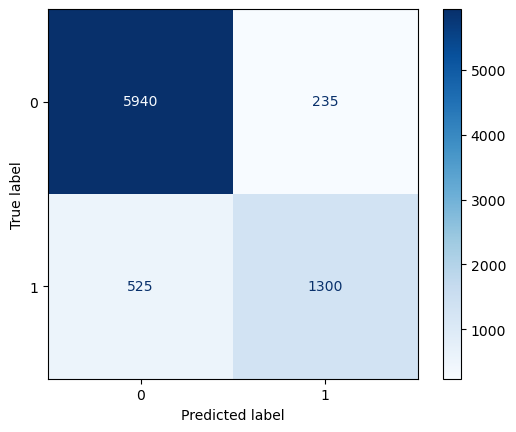

In [75]:
cm_o_validk= confusion_matrix(validNorm1['c_b'] ,valid_pred_t10_k)
cm_display_oVALIDk= ConfusionMatrixDisplay(confusion_matrix=cm_o_validk, display_labels=knn_t10_k.classes_)
cm_display_oVALIDk.plot(cmap='Blues')

In [76]:
FN = cm_o_validk[1, 0]  # False Negatives
TP = cm_o_validk[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")

False Negative Rate: 0.29


In [77]:
# fit_features = list(knn_t10.feature_names_in_)
# print(fit_features)


In [78]:
# # Display current column names
# print("Original Column Names:", test_df.columns.tolist())

# # Clean the column names
# test_df.columns = (
#     test_df.columns
#     .str.strip()                # Remove leading and trailing spaces
#     .str.lower()                # Convert to lowercase
#     .str.replace(' ', '_')      # Replace spaces with underscores
#     .str.replace(':', '_')      # Replace colons with underscores
#     .str.replace('-', '_')      # Replace hyphens with underscores
#     .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
# )

# # Display cleaned column names
# print("Cleaned Column Names:", test_df.columns.tolist())

In [79]:
# # Update 'so' column: Keep desired values, rename others as 'Other'_df['so'] = plant_df['so'].apply(lambda x: x if x in desired_so_values else 'Other_alarm')
# test_df['so'] = test_df['so'].apply(lambda x: x if x in desired_so_values else 'Other_alarm')

In [80]:
# # Count the number of rows with 'Other' in the 'so' column
# other_count = test_df[test_df['so'] == 'Other_alarm'].shape[0]

# print(f"Number of rows with 'Other' as the value in the 'so' column: {other_count}")


In [81]:
# columns_to_drop_test1= ['s_no','h', 'hour_0_6', 'alarm_tag_type', 'flow','d', '1st_week','z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']

# # Drop the specified columns
# test_df = test_df.drop(columns=columns_to_drop_test1)

# # Check the resulting DataFrame
# print(test_df.head())


In [82]:
# #convert to dummy variables
# test_df = pd.get_dummies(test_df, prefix_sep='_',dtype='int', drop_first=True)
# test_df.columns

In [83]:
# #Scale the new data
# # Transform the full dataset
# testNorm_t10= pd.concat([pd.DataFrame(scaler.transform(test_df[['atd', 'm']]), 
#                                     columns=['zatd', 'zm']),
#                        test_df[['chb', 'level', 'others', 'pressure', 'temperature',
#        'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
#        '4th_week', 'so_XASS-3140']]], axis=1)

In [84]:
# testNorm_t10.columns

In [85]:
# testNorm_t10_edited = testNorm_t10.reindex(columns=fit_features, fill_value=0)
# #print(testNorm_t10_edited['chb'])

In [86]:
# print(testNorm_t10_edited.columns)

In [87]:
# test_pred_t10=knn_t10.predict(testNorm_t10_edited[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others', 'hour_7_12',
#        'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week', '4th_week',
#        'so_FAL-3020','so_FAL-3452A', 'so_FALL-3452A', 'so_LDAH-3708', 'so_PAH-3200',
#        'so_PAL-3356', 'so_PAL-3390', 'so_PDAH-3190', 'so_PDIT-3091',
#        'so_XASS-3140']])

In [88]:
# accuracy_score(testNorm_t10['chb'] ,test_pred_t10)

In [89]:
#overall 'so' column processing

In [90]:
o_plant_df.columns

Index(['C-B', 'ATN', 'DURATION', 'MONTH', 'Flow', 'Level', 'Pressure',
       'Temperature', 'Others', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18',
       'Hour:19-24', '1st Week', '2nd week', '3rd week', '4th week'],
      dtype='object')

In [91]:
o_plant_df['ATN'] = o_plant_df['ATN'].str.split('-').str[0]

In [92]:
o_plant_df

,C-B,ATN,DURATION,MONTH,Flow,Level,Pressure,Temperature,Others,Hour:0-6,Hour:7-12,Hour:13-18,Hour:19-24,1st Week,2nd week,3rd week,4th week
0,0,XI,0,6,0,0,0,0,1,0,1,0,0,0,0,0,1
1,0,XI,0,7,0,0,0,0,1,0,0,1,0,0,1,0,0
2,0,XI,0,7,0,0,0,0,1,0,0,1,0,0,1,0,0
3,0,XI,0,10,0,0,0,0,1,0,0,1,0,0,1,0,0
4,0,XI,0,10,0,0,0,0,1,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0,LAL,2485,5,0,1,0,0,0,0,0,1,0,0,0,0,1
19996,0,LAL,2492,12,0,1,0,0,0,0,1,0,0,0,0,1,0
19997,0,FAL,2502,8,1,0,0,0,0,0,0,1,0,0,1,0,0
19998,0,TAL,2502,7,0,0,0,1,0,0,1,0,0,0,0,0,1


In [93]:
# Count the number of unique values in the 'so' column
unique_count_so= o_plant_df['ATN'].nunique()
print(f"Number of unique values in the 'so' column: {unique_count_so}")


Number of unique values in the 'so' column: 56


In [94]:
# Display current column names
print("Original test Column Names:", o_plant_df.columns.tolist())

# Clean the column names
o_plant_df.columns = (
    o_plant_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned test Column Names:",o_plant_df.columns.tolist())

Original test Column Names: ['C-B', 'ATN', 'DURATION', 'MONTH', 'Flow', 'Level', 'Pressure', 'Temperature', 'Others', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18', 'Hour:19-24', '1st Week', '2nd week', '3rd week', '4th week']
Cleaned test Column Names: ['c_b', 'atn', 'duration', 'month', 'flow', 'level', 'pressure', 'temperature', 'others', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [95]:
columns_to_drop_planto= ['hour_0_6', 'flow', '1st_week']

# Drop the specified columns
o_plant_df = o_plant_df.drop(columns=columns_to_drop_planto)

# Check the resulting DataFrame
print(o_plant_df.head())

   c_b atn  duration  month  level  pressure  temperature  others  hour_7_12  \
0    0  XI         0      6      0         0            0       1          1   
1    0  XI         0      7      0         0            0       1          0   
2    0  XI         0      7      0         0            0       1          0   
3    0  XI         0     10      0         0            0       1          0   
4    0  XI         0     10      0         0            0       1          1   

   hour_13_18  hour_19_24  2nd_week  3rd_week  4th_week  
0           0           0         0         0         1  
1           1           0         1         0         0  
2           1           0         1         0         0  
3           1           0         1         0         0  
4           0           0         1         0         0  


In [96]:
#convert to dummy variables
o_plant_df = pd.get_dummies(o_plant_df, prefix_sep='_',dtype='int', drop_first=True)
o_plant_df.columns

Index(['c_b', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_AAHH', 'atn_AAL', 'atn_AT', 'atn_DAH',
       'atn_DAHH', 'atn_EAL', 'atn_ESDV', 'atn_FAH', 'atn_FAL', 'atn_FALL',
       'atn_FIC', 'atn_FIT', 'atn_FSL', 'atn_FT', 'atn_HTCP', 'atn_HTP',
       'atn_IT', 'atn_KM', 'atn_LAH', 'atn_LAHH', 'atn_LAL', 'atn_LALL',
       'atn_LALLL', 'atn_LDAH', 'atn_LIT', 'atn_LSHH', 'atn_LT', 'atn_MM',
       'atn_PAH', 'atn_PAHH', 'atn_PAL', 'atn_PALL', 'atn_PDAH', 'atn_PDIT',
       'atn_PIT', 'atn_PM', 'atn_PT', 'atn_SC', 'atn_ST', 'atn_TAH',
       'atn_TAHH', 'atn_TAL', 'atn_TDAH', 'atn_TIT', 'atn_TT', 'atn_UA',
       'atn_UXA', 'atn_VAH', 'atn_VAHH', 'atn_VIT', 'atn_XA', 'atn_XASS',
       'atn_XI', 'atn_XV', 'atn_ZA'],
      dtype='object')

In [97]:
o_plant_df.head()

,c_b,duration,month,level,pressure,temperature,others,hour_7_12,hour_13_18,hour_19_24,...,atn_UA,atn_UXA,atn_VAH,atn_VAHH,atn_VIT,atn_XA,atn_XASS,atn_XI,atn_XV,atn_ZA
0,0,0,6,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,7,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,7,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,10,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,10,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [98]:
#Partition the data into train and valid. Make sure you set seed
# random_state is set to a defined value to get the same partitions when re-running the code
trainData_o= o_plant_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData_o= o_plant_df.drop(trainData_o.index)

In [99]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData_o[['duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_AAHH', 'atn_AAL', 'atn_AT', 'atn_DAH',
       'atn_DAHH', 'atn_EAL', 'atn_ESDV', 'atn_FAH', 'atn_FAL', 'atn_FALL',
       'atn_FIC', 'atn_FIT', 'atn_FSL', 'atn_FT', 'atn_HTCP', 'atn_HTP',
       'atn_IT', 'atn_KM', 'atn_LAH', 'atn_LAHH', 'atn_LAL', 'atn_LALL',
       'atn_LALLL', 'atn_LDAH', 'atn_LIT', 'atn_LSHH', 'atn_LT', 'atn_MM',
       'atn_PAH', 'atn_PAHH', 'atn_PAL', 'atn_PALL', 'atn_PDAH', 'atn_PDIT',
       'atn_PIT', 'atn_PM', 'atn_PT', 'atn_SC', 'atn_ST', 'atn_TAH',
       'atn_TAHH', 'atn_TAL', 'atn_TDAH', 'atn_TIT', 'atn_TT', 'atn_UA',
       'atn_UXA', 'atn_VAH', 'atn_VAHH', 'atn_VIT', 'atn_XA', 'atn_XASS',
       'atn_XI', 'atn_XV', 'atn_ZA']])  # Note the use of an array of column names

# Transform the full dataset
o_plantNorm = pd.concat([pd.DataFrame(scaler.transform(o_plant_df[['duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_AAHH', 'atn_AAL', 'atn_AT', 'atn_DAH',
       'atn_DAHH', 'atn_EAL', 'atn_ESDV', 'atn_FAH', 'atn_FAL', 'atn_FALL',
       'atn_FIC', 'atn_FIT', 'atn_FSL', 'atn_FT', 'atn_HTCP', 'atn_HTP',
       'atn_IT', 'atn_KM', 'atn_LAH', 'atn_LAHH', 'atn_LAL', 'atn_LALL',
       'atn_LALLL', 'atn_LDAH', 'atn_LIT', 'atn_LSHH', 'atn_LT', 'atn_MM',
       'atn_PAH', 'atn_PAHH', 'atn_PAL', 'atn_PALL', 'atn_PDAH', 'atn_PDIT',
       'atn_PIT', 'atn_PM', 'atn_PT', 'atn_SC', 'atn_ST', 'atn_TAH',
       'atn_TAHH', 'atn_TAL', 'atn_TDAH', 'atn_TIT', 'atn_TT', 'atn_UA',
       'atn_UXA', 'atn_VAH', 'atn_VAHH', 'atn_VIT', 'atn_XA', 'atn_XASS',
       'atn_XI', 'atn_XV', 'atn_ZA' ]]),  columns=['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature', 
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 
'z3rd_week', 'z4th_week', 'zatn_AAHH', 'zatn_AAL', 'zatn_AT', 'zatn_DAH', 
'zatn_DAHH', 'zatn_EAL', 'zatn_ESDV', 'zatn_FAH', 'zatn_FAL', 'zatn_FALL', 
'zatn_FIC', 'zatn_FIT', 'zatn_FSL', 'zatn_FT', 'zatn_HTCP', 'zatn_HTP', 
'zatn_IT', 'zatn_KM', 'zatn_LAH', 'zatn_LAHH', 'zatn_LAL', 'zatn_LALL', 
'zatn_LALLL', 'zatn_LDAH', 'zatn_LIT', 'zatn_LSHH', 'zatn_LT', 'zatn_MM', 
'zatn_PAH', 'zatn_PAHH', 'zatn_PAL', 'zatn_PALL', 'zatn_PDAH', 'zatn_PDIT', 
'zatn_PIT', 'zatn_PM', 'zatn_PT', 'zatn_SC', 'zatn_ST', 'zatn_TAH', 
'zatn_TAHH', 'zatn_TAL', 'zatn_TDAH', 'zatn_TIT', 'zatn_TT', 'zatn_UA', 
'zatn_UXA', 'zatn_VAH', 'zatn_VAHH', 'zatn_VIT', 'zatn_XA', 'zatn_XASS', 
'zatn_XI', 'zatn_XV', 'zatn_ZA'
]),o_plant_df[['c_b']]], axis=1)
trainNorm_o= o_plantNorm.iloc[trainData_o.index]
#Similarly, get the valid one as well
validNorm_o= o_plantNorm.iloc[validData_o.index]

In [100]:
trainNorm_o.head()

,zduration,zmonth,zlevel,zpressure,ztemperature,zothers,zhour_7_12,zhour_13_18,zhour_19_24,z2nd_week,...,zatn_UXA,zatn_VAH,zatn_VAHH,zatn_VIT,zatn_XA,zatn_XASS,zatn_XI,zatn_XV,zatn_ZA,c_b
11456,-0.372670,0.616393,-0.751493,-0.436436,-0.362540,1.917430,1.653380,-0.658423,-0.505463,-0.644278,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,0
16528,0.207208,-0.216758,-0.751493,-0.436436,2.758319,-0.521531,-0.604822,1.518781,-0.505463,-0.644278,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,0
3253,-0.471733,0.338676,-0.751493,2.291288,-0.362540,-0.521531,1.653380,-0.658423,-0.505463,1.552125,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,1
18614,1.714891,-1.605344,-0.751493,-0.436436,-0.362540,1.917430,-0.604822,-0.658423,1.978384,-0.644278,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,0
1544,-0.471733,1.171828,-0.751493,-0.436436,-0.362540,-0.521531,-0.604822,-0.658423,1.978384,-0.644278,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,1


In [101]:
knn_o= KNeighborsClassifier(n_neighbors=3).fit(trainNorm_o[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature', 
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 
'z3rd_week', 'z4th_week', 'zatn_AAHH', 'zatn_AAL', 'zatn_AT', 'zatn_DAH', 
'zatn_DAHH', 'zatn_EAL', 'zatn_ESDV', 'zatn_FAH', 'zatn_FAL', 'zatn_FALL', 
'zatn_FIC', 'zatn_FIT', 'zatn_FSL', 'zatn_FT', 'zatn_HTCP', 'zatn_HTP', 
'zatn_IT', 'zatn_KM', 'zatn_LAH', 'zatn_LAHH', 'zatn_LAL', 'zatn_LALL', 
'zatn_LALLL', 'zatn_LDAH', 'zatn_LIT', 'zatn_LSHH', 'zatn_LT', 'zatn_MM', 
'zatn_PAH', 'zatn_PAHH', 'zatn_PAL', 'zatn_PALL', 'zatn_PDAH', 'zatn_PDIT', 
'zatn_PIT', 'zatn_PM', 'zatn_PT', 'zatn_SC', 'zatn_ST', 'zatn_TAH', 
'zatn_TAHH', 'zatn_TAL', 'zatn_TDAH', 'zatn_TIT', 'zatn_TT', 'zatn_UA', 
'zatn_UXA', 'zatn_VAH', 'zatn_VAHH', 'zatn_VIT', 'zatn_XA', 'zatn_XASS', 
'zatn_XI', 'zatn_XV', 'zatn_ZA'
]], trainNorm_o['c_b'])

In [102]:
valid_pred_o=knn_o.predict(validNorm_o[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature', 
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 
'z3rd_week', 'z4th_week', 'zatn_AAHH', 'zatn_AAL', 'zatn_AT', 'zatn_DAH', 
'zatn_DAHH', 'zatn_EAL', 'zatn_ESDV', 'zatn_FAH', 'zatn_FAL', 'zatn_FALL', 
'zatn_FIC', 'zatn_FIT', 'zatn_FSL', 'zatn_FT', 'zatn_HTCP', 'zatn_HTP', 
'zatn_IT', 'zatn_KM', 'zatn_LAH', 'zatn_LAHH', 'zatn_LAL', 'zatn_LALL', 
'zatn_LALLL', 'zatn_LDAH', 'zatn_LIT', 'zatn_LSHH', 'zatn_LT', 'zatn_MM', 
'zatn_PAH', 'zatn_PAHH', 'zatn_PAL', 'zatn_PALL', 'zatn_PDAH', 'zatn_PDIT', 
'zatn_PIT', 'zatn_PM', 'zatn_PT', 'zatn_SC', 'zatn_ST', 'zatn_TAH', 
'zatn_TAHH', 'zatn_TAL', 'zatn_TDAH', 'zatn_TIT', 'zatn_TT', 'zatn_UA', 
'zatn_UXA', 'zatn_VAH', 'zatn_VAHH', 'zatn_VIT', 'zatn_XA', 'zatn_XASS', 
'zatn_XI', 'zatn_XV', 'zatn_ZA'
]])

In [103]:
accuracy_score(validNorm_o['c_b'] ,valid_pred_o)

0.913375

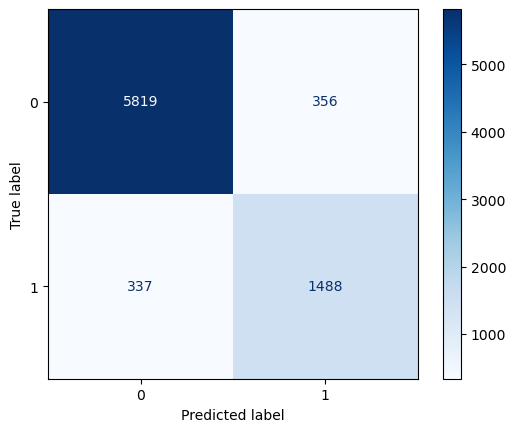

In [104]:
cm_52_validk= confusion_matrix(validNorm_o['c_b'] ,valid_pred_o)
cm_display_o52= ConfusionMatrixDisplay(confusion_matrix=cm_52_validk, display_labels=knn_o.classes_)
cm_display_o52.plot(cmap='Blues')

In [105]:
FN = cm_52_validk[1, 0]  # False Negatives
TP = cm_52_validk[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")

False Negative Rate: 0.18


In [106]:
#knn best K 
train_X = trainNorm_o[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature', 
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 
'z3rd_week', 'z4th_week', 'zatn_AAHH', 'zatn_AAL', 'zatn_AT', 'zatn_DAH', 
'zatn_DAHH', 'zatn_EAL', 'zatn_ESDV', 'zatn_FAH', 'zatn_FAL', 'zatn_FALL', 
'zatn_FIC', 'zatn_FIT', 'zatn_FSL', 'zatn_FT', 'zatn_HTCP', 'zatn_HTP', 
'zatn_IT', 'zatn_KM', 'zatn_LAH', 'zatn_LAHH', 'zatn_LAL', 'zatn_LALL', 
'zatn_LALLL', 'zatn_LDAH', 'zatn_LIT', 'zatn_LSHH', 'zatn_LT', 'zatn_MM', 
'zatn_PAH', 'zatn_PAHH', 'zatn_PAL', 'zatn_PALL', 'zatn_PDAH', 'zatn_PDIT', 
'zatn_PIT', 'zatn_PM', 'zatn_PT', 'zatn_SC', 'zatn_ST', 'zatn_TAH', 
'zatn_TAHH', 'zatn_TAL', 'zatn_TDAH', 'zatn_TIT', 'zatn_TT', 'zatn_UA', 
'zatn_UXA', 'zatn_VAH', 'zatn_VAHH', 'zatn_VIT', 'zatn_XA', 'zatn_XASS', 
'zatn_XI', 'zatn_XV', 'zatn_ZA'
]]
train_y = trainNorm_o['c_b']
valid_X = validNorm_o[['zduration', 'zmonth', 'zlevel', 'zpressure', 'ztemperature', 
'zothers', 'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 
'z3rd_week', 'z4th_week', 'zatn_AAHH', 'zatn_AAL', 'zatn_AT', 'zatn_DAH', 
'zatn_DAHH', 'zatn_EAL', 'zatn_ESDV', 'zatn_FAH', 'zatn_FAL', 'zatn_FALL', 
'zatn_FIC', 'zatn_FIT', 'zatn_FSL', 'zatn_FT', 'zatn_HTCP', 'zatn_HTP', 
'zatn_IT', 'zatn_KM', 'zatn_LAH', 'zatn_LAHH', 'zatn_LAL', 'zatn_LALL', 
'zatn_LALLL', 'zatn_LDAH', 'zatn_LIT', 'zatn_LSHH', 'zatn_LT', 'zatn_MM', 
'zatn_PAH', 'zatn_PAHH', 'zatn_PAL', 'zatn_PALL', 'zatn_PDAH', 'zatn_PDIT', 
'zatn_PIT', 'zatn_PM', 'zatn_PT', 'zatn_SC', 'zatn_ST', 'zatn_TAH', 
'zatn_TAHH', 'zatn_TAL', 'zatn_TDAH', 'zatn_TIT', 'zatn_TT', 'zatn_UA', 
'zatn_UXA', 'zatn_VAH', 'zatn_VAHH', 'zatn_VIT', 'zatn_XA', 'zatn_XASS', 
'zatn_XI', 'zatn_XV', 'zatn_ZA'
]]
valid_y = validNorm_o['c_b']
results = []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 4):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    accuracy = accuracy_score(valid_y, knn.predict(valid_X))
    results.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results = pd.DataFrame(results)

# Print the results and the best k value
print(results)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

   k  accuracy
0  1  0.894625
1  2  0.903375
2  3  0.913375
Max Accuracy: 0.913375 at k = 3


In [107]:
boiler_df.columns
boiler_df.columns
boiler_df= boiler_df.drop(columns=['atn'])
print(boiler_df.columns)



Index(['c_b', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week'],
      dtype='object')


In [108]:
#Separate X and y variables
X=boiler_df.drop(columns=['c_b'])
y=boiler_df['c_b']
#Partition
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

In [109]:
#Develop trees
boilerTree = DecisionTreeClassifier(random_state=0, max_depth=5)
boilerTree.fit(train_X, train_y)
classificationSummary(train_y, boilerTree.predict(train_X))

Confusion Matrix (Accuracy 0.8698)

       Prediction
Actual    0    1
     0 2467  221
     1  252  692


In [110]:
#Calculate both for training data as well as validation data
classificationSummary(valid_y, boilerTree.predict(valid_X))

Confusion Matrix (Accuracy 0.8613)

       Prediction
Actual    0    1
     0 1646  151
     1  185  440


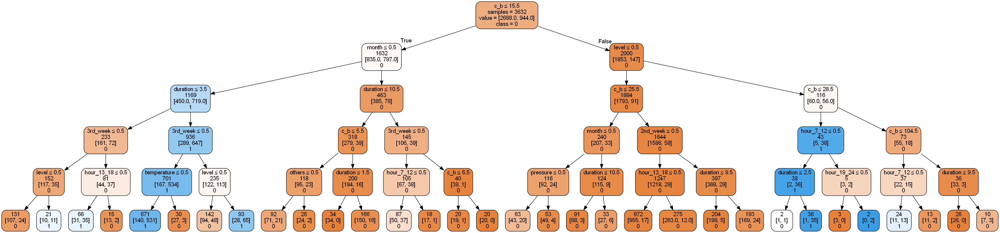

In [111]:
plotDecisionTree(boilerTree, feature_names=boiler_df.columns[:12], class_names=boilerTree.classes_)

In [112]:
# Five-fold cross-validation of the full decision tree classifier
treeClassifier = DecisionTreeClassifier()

scores = cross_val_score(treeClassifier, train_X, train_y, cv=5)
print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

Accuracy scores of each fold:  ['0.854', '0.873', '0.855', '0.848', '0.872']
Accuracy: 0.861 (+/- 0.020)
Accuracy: 0.861 (+/- 0.010)


In [113]:
# # Create a smaller classification tree for training partition using DecisionTreeClassifier() function control parameters:
# #  - Maximum Tree depth (number of splits) = 30;
# #  - Minimum impurity decrease per split = 0.01 (SIMILAR TO ADJ R SQUARE ALSO LIMIT OVERFITTING 
# #  - Minimum number of sample records in a node for splitting = 20.   ONCE YOU SPLIT HOW MANY DATA POINTS NEED TO BE THERE 
# smallClassTree = DecisionTreeClassifier(max_depth=30, 
#         min_impurity_decrease=0.01, min_samples_split=20)
# smallClassTree.fit(train_X, train_y)

# # Display classification tree for training partition.
# print('Small Classification Tree with Control Parameters')
# plotDecisionTree(smallClassTree, feature_names=train_X.columns)

In [114]:
#classificationSummary(train_y, smallClassTree.predict(train_X))

In [115]:
# smallClassTree1 = DecisionTreeClassifier(max_depth=20, 
#         min_impurity_decrease=0.020, min_samples_split=25)
# smallClassTree1.fit(train_X, train_y)

# # Display classification tree for training partition.
# print('Small Classification Tree with Control Parameters')
# plotDecisionTree(smallClassTree1, feature_names=train_X.columns)

In [116]:
# classificationSummary(train_y, smallClassTree1.predict(train_X))

In [117]:
# smallClassTree2 = DecisionTreeClassifier(max_depth=30, 
#         min_impurity_decrease=0.001, min_samples_split=15)
# smallClassTree2.fit(train_X, train_y)

# # Display classification tree for training partition.
# print('Small Classification Tree with Control Parameters')
# plotDecisionTree(smallClassTree2, feature_names=train_X.columns)

In [118]:
# classificationSummary(train_y, smallClassTree2.predict(train_X))

In [119]:
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [10, 20, 30, 40], 
    'min_samples_split': [20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1) #n_jobs=-1 means 
        #that the availalbe computer memory (CPU) will be used to make calculations faster. 
gridSearch.fit(train_X, train_y)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)


Initial score:  0.8747212022690327
Initial parameters:  {'max_depth': 20, 'min_impurity_decrease': 0.0005, 'min_samples_split': 20}


In [120]:
# Adapt grid based on result from initial grid search
param_grid = {
    'max_depth': list(range(25, 35)), 
    'min_samples_split': list(range(5, 25)), 
    'min_impurity_decrease': [0.0005, 0.0006, 0.0007,0.0004], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Improved score: ', gridSearch.best_score_)
print('Improved parameters: ', gridSearch.best_params_)

bestClassTree = gridSearch.best_estimator_

Improved score:  0.8807787768898185
Improved parameters:  {'max_depth': 26, 'min_impurity_decrease': 0.0004, 'min_samples_split': 10}


best Classification Tree with Control Parameters


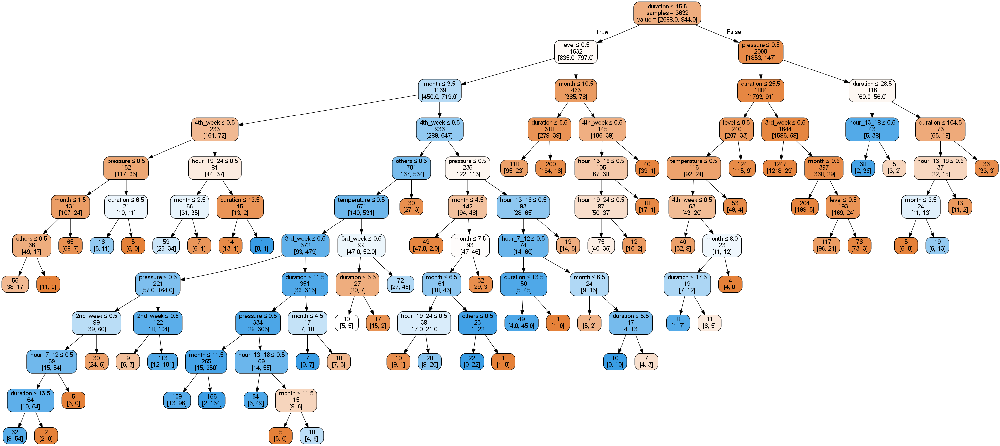

In [121]:
bestClassTree2 = DecisionTreeClassifier(max_depth=27, 
        min_impurity_decrease=0.0004, min_samples_split=11)
bestClassTree2.fit(train_X, train_y)

# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTree2, feature_names=train_X.columns)

In [122]:
classificationSummary(train_y, bestClassTree2.predict(train_X))
classificationSummary(valid_y, bestClassTree2.predict(valid_X))

Confusion Matrix (Accuracy 0.9023)

       Prediction
Actual    0    1
     0 2566  122
     1  233  711
Confusion Matrix (Accuracy 0.8803)

       Prediction
Actual    0    1
     0 1696  101
     1  189  436


In [123]:
classificationSummary(train_y, bestClassTree.predict(train_X))


Confusion Matrix (Accuracy 0.9025)

       Prediction
Actual    0    1
     0 2566  122
     1  232  712


TOP 10 DECISION TREE

In [124]:
plant_df.columns

Index(['c_b', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_FAL-3020', 'atn_FAL-3452A',
       'atn_FALL-3452A', 'atn_LDAH-3708', 'atn_PAH-3200', 'atn_PAL-3356',
       'atn_PAL-3390', 'atn_PDAH-3190', 'atn_PDIT-3091', 'atn_XASS-3140'],
      dtype='object')

In [125]:
#Separate X and y variables
X_t10=plant_df.drop(columns=['c_b'])
y_t10=plant_df['c_b']
#Partition
train_Xt10, valid_Xt10, train_yt10, valid_yt10 = train_test_split(X_t10, y_t10, test_size=0.4, random_state=1)

In [126]:
#Develop trees
plantTree_t10 = DecisionTreeClassifier(random_state=0, max_depth=10)
plantTree_t10.fit(train_Xt10, train_yt10)
classificationSummary(train_yt10, plantTree_t10.predict(train_Xt10))

Confusion Matrix (Accuracy 0.9077)

       Prediction
Actual    0    1
     0 8872  410
     1  697 2021


In [127]:
classificationSummary(valid_yt10, plantTree_t10.predict(valid_Xt10))

Confusion Matrix (Accuracy 0.8822)

       Prediction
Actual    0    1
     0 5785  367
     1  575 1273


In [128]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score

# Predictions from the trained model
y_pred = plantTree_t10.predict(train_Xt10)

# Calculate confusion matrix
tn, fp, fn, tp = confusion_matrix(train_yt10, y_pred).ravel()

# Calculate precision, recall, specificity, sensitivity
precision = precision_score(train_yt10, y_pred)
recall = recall_score(train_yt10, y_pred)
specificity = tn / (tn + fp)  # Specificity calculation
sensitivity = recall  # Sensitivity is the same as recall
accuracy = accuracy_score(train_yt10, y_pred)

# Print the results
print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Accuracy: {accuracy:.4f}")


Precision: 0.8313
Recall (Sensitivity): 0.7436
Specificity: 0.9558
Accuracy: 0.9077


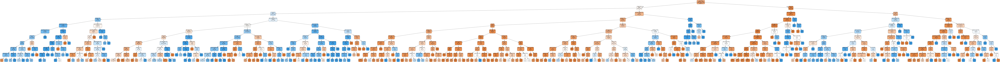

In [129]:
plotDecisionTree(plantTree_t10, feature_names=plant_df.columns[:22], class_names=plantTree_t10.classes_)

In [130]:
# Five-fold cross-validation of the full decision tree classifier
treeClassifier = DecisionTreeClassifier()

scores = cross_val_score(treeClassifier, train_Xt10, train_yt10, cv=5)
print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

Accuracy scores of each fold:  ['0.889', '0.877', '0.883', '0.882', '0.880']
Accuracy: 0.882 (+/- 0.008)
Accuracy: 0.882 (+/- 0.004)


In [131]:
#grid_search
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [10, 20, 30, 40], 
    'min_samples_split': [20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch= GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1) #n_jobs=-1 means 
        #that the availalbe computer memory (CPU) will be used to make calculations faster. 
gridSearch.fit(train_Xt10, train_yt10)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)



Initial score:  0.8921666666666667
Initial parameters:  {'max_depth': 20, 'min_impurity_decrease': 0, 'min_samples_split': 20}


In [132]:
# Adapt grid based on result from initial grid search
param_grid = {
    'max_depth': list(range(15, 25)), 
    'min_samples_split': list(range(16, 25)), 
    'min_impurity_decrease': [0, 0.0001, 0.0005, 0.001, 0.002, 0.005], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_Xt10, train_yt10)
print('Improved score: ', gridSearch.best_score_)
print('Improved parameters: ', gridSearch.best_params_)

bestClassTree = gridSearch.best_estimator_

Improved score:  0.8981666666666668
Improved parameters:  {'max_depth': 19, 'min_impurity_decrease': 0.0001, 'min_samples_split': 16}


best Classification Tree with Control Parameters


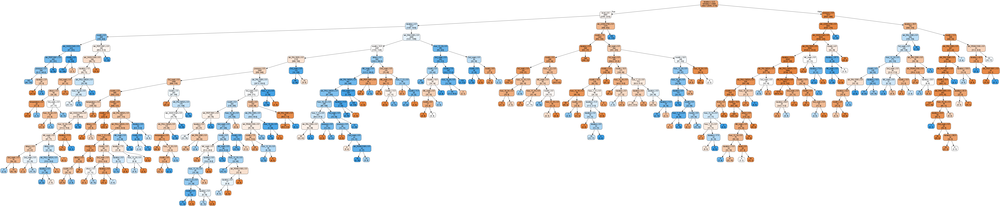

In [133]:
# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTree, feature_names=train_Xt10.columns)

best Classification Tree with Control Parameters


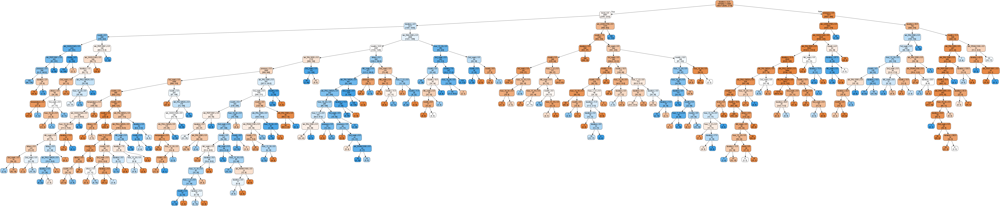

In [134]:
bestClassTreet10 = DecisionTreeClassifier(max_depth=26, 
        min_impurity_decrease=0.0001, min_samples_split=16)
bestClassTreet10.fit(train_Xt10, train_yt10)

# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTreet10, feature_names=train_Xt10.columns)

In [135]:
classificationSummary(valid_yt10, bestClassTreet10.predict(valid_Xt10))

Confusion Matrix (Accuracy 0.8964)

       Prediction
Actual    0    1
     0 5751  401
     1  428 1420


52 TREE

In [136]:
o_plant_df.columns

Index(['c_b', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week',
       '3rd_week', '4th_week', 'atn_AAHH', 'atn_AAL', 'atn_AT', 'atn_DAH',
       'atn_DAHH', 'atn_EAL', 'atn_ESDV', 'atn_FAH', 'atn_FAL', 'atn_FALL',
       'atn_FIC', 'atn_FIT', 'atn_FSL', 'atn_FT', 'atn_HTCP', 'atn_HTP',
       'atn_IT', 'atn_KM', 'atn_LAH', 'atn_LAHH', 'atn_LAL', 'atn_LALL',
       'atn_LALLL', 'atn_LDAH', 'atn_LIT', 'atn_LSHH', 'atn_LT', 'atn_MM',
       'atn_PAH', 'atn_PAHH', 'atn_PAL', 'atn_PALL', 'atn_PDAH', 'atn_PDIT',
       'atn_PIT', 'atn_PM', 'atn_PT', 'atn_SC', 'atn_ST', 'atn_TAH',
       'atn_TAHH', 'atn_TAL', 'atn_TDAH', 'atn_TIT', 'atn_TT', 'atn_UA',
       'atn_UXA', 'atn_VAH', 'atn_VAHH', 'atn_VIT', 'atn_XA', 'atn_XASS',
       'atn_XI', 'atn_XV', 'atn_ZA'],
      dtype='object')

In [137]:
#Separate X and y variables
X_o=o_plant_df.drop(columns=['c_b'])
y_o=o_plant_df['c_b']
#Partition
train_Xo, valid_Xo, train_yo, valid_yo = train_test_split(X_o, y_o, test_size=0.4, random_state=1)


In [138]:
#Develop trees
o_plantTree = DecisionTreeClassifier(random_state=0, max_depth=10)
o_plantTree.fit(train_Xo, train_yo)
classificationSummary(train_yo, o_plantTree.predict(train_Xo))

Confusion Matrix (Accuracy 0.9168)

       Prediction
Actual    0    1
     0 8895  387
     1  611 2107


In [139]:
#Calculate both for training data as well as validation data
classificationSummary(valid_yo, o_plantTree.predict(valid_Xo))

Confusion Matrix (Accuracy 0.8881)

       Prediction
Actual    0    1
     0 5771  381
     1  514 1334


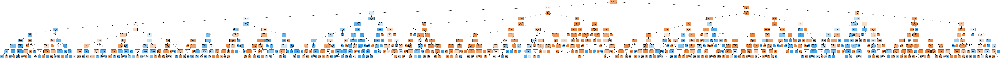

In [140]:
plotDecisionTree(o_plantTree, feature_names=o_plant_df.columns[:67], class_names=o_plantTree.classes_)

In [141]:
#cross validation

In [142]:
# Five-fold cross-validation of the full decision tree classifier
treeClassifier = DecisionTreeClassifier()

scores = cross_val_score(treeClassifier, train_Xo, train_yo, cv=5)
print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

Accuracy scores of each fold:  ['0.902', '0.892', '0.897', '0.889', '0.892']
Accuracy: 0.895 (+/- 0.009)
Accuracy: 0.895 (+/- 0.005)


In [143]:
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [10, 20, 30, 40], 
    'min_samples_split': [20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1) #n_jobs=-1 means 
        #that the availalbe computer memory (CPU) will be used to make calculations faster. 
gridSearch.fit(train_Xo, train_yo)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)

Initial score:  0.8988333333333334
Initial parameters:  {'max_depth': 20, 'min_impurity_decrease': 0, 'min_samples_split': 20}


In [144]:
# Adapt grid based on result from initial grid search
param_grid = {
    'max_depth': list(range(15,24 )), 
    'min_samples_split': list(range(16, 25)), 
    'min_impurity_decrease': [0, 0.0001, 0.0005, 0.001, 0.002, 0.005], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_Xo, train_yo)
print('Improved score: ', gridSearch.best_score_)
print('Improved parameters: ', gridSearch.best_params_)

bestClassTree = gridSearch.best_estimator_

Improved score:  0.9023333333333333
Improved parameters:  {'max_depth': 23, 'min_impurity_decrease': 0.0001, 'min_samples_split': 16}


best Classification Tree with Control Parameters


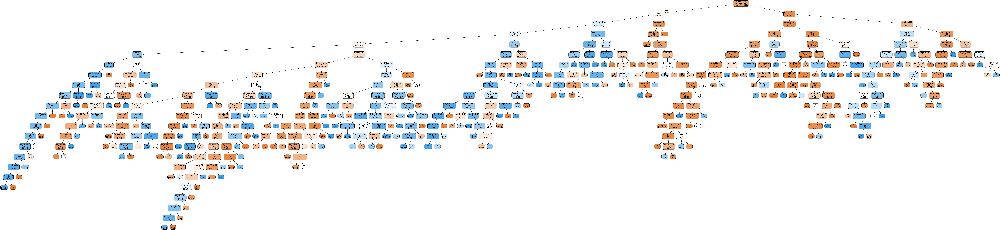

In [145]:
# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTree, feature_names=train_Xo.columns)

best Classification Tree with Control Parameters


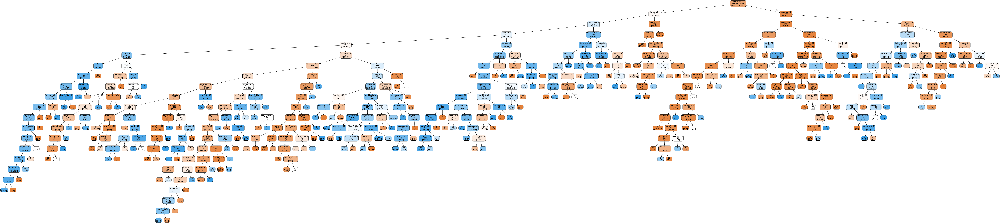

In [146]:
bestClassTree52 = DecisionTreeClassifier(max_depth=21, 
        min_impurity_decrease=0.0001, min_samples_split=16)
bestClassTree52.fit(train_Xo, train_yo)

# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTree52, feature_names=train_Xo.columns)

In [147]:
classificationSummary(valid_yo, bestClassTree52.predict(valid_Xo))

Confusion Matrix (Accuracy 0.9041)

       Prediction
Actual    0    1
     0 5794  358
     1  409 1439


In [148]:
rf = RandomForestClassifier(n_estimators=500, random_state=1)
rf.fit(train_Xo, train_yo)

RandomForestClassifier(n_estimators=500, random_state=1)

     feature    importance           std
0   duration  3.558855e-01  4.297831e-02
1      month  1.936772e-01  2.135372e-02
3   pressure  4.345983e-02  3.372653e-02
32   atn_LAL  3.135384e-02  2.014208e-02
9   2nd_week  3.037919e-02  8.941785e-03
..       ...           ...           ...
13   atn_AAL  2.402911e-07  3.224887e-06
61   atn_VIT  1.020477e-07  8.021597e-07
57    atn_UA  0.000000e+00  0.000000e+00
15   atn_DAH  0.000000e+00  0.000000e+00
49    atn_SC  0.000000e+00  0.000000e+00

[67 rows x 3 columns]


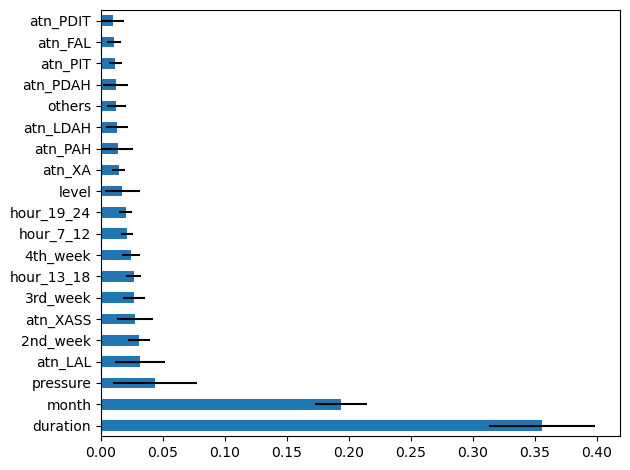

In [149]:
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

df = pd.DataFrame({'feature': train_Xo.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance',ascending=False)
print(df)
# Select top 20 features
df_top20 = df.head(20)
#plt.figure(figsize=(12000, 100)) 
ax = df_top20.plot(kind='barh', xerr='std', x='feature', legend=False)

ax.set_ylabel('')
#plt.xticks(rotation=45) 
plt.tight_layout()
#plt.tight_layout(pad=20.0)
plt.show()

In [150]:
classificationSummary(valid_yo, rf.predict(valid_Xo))

Confusion Matrix (Accuracy 0.9154)

       Prediction
Actual    0    1
     0 5843  309
     1  368 1480


In [151]:
boost = GradientBoostingClassifier()
boost.fit(train_Xo, train_yo)

GradientBoostingClassifier()

In [152]:
classificationSummary(valid_yo, boost.predict(valid_Xo))

Confusion Matrix (Accuracy 0.8848)

       Prediction
Actual    0    1
     0 5738  414
     1  508 1340


In [153]:
##CLEANING TRAINING DATA

# Display current column names
print("Original Column Names:", plant_df.columns.tolist())

# Clean the column names
a_plant_df.columns = (
    a_plant_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", a_plant_df.columns.tolist())

Original Column Names: ['c_b', 'duration', 'month', 'level', 'pressure', 'temperature', 'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week', '4th_week', 'atn_FAL-3020', 'atn_FAL-3452A', 'atn_FALL-3452A', 'atn_LDAH-3708', 'atn_PAH-3200', 'atn_PAL-3356', 'atn_PAL-3390', 'atn_PDAH-3190', 'atn_PDIT-3091', 'atn_XASS-3140']
Cleaned Column Names: ['c_b', 'atn', 'duration', 'month', 'flow', 'level', 'pressure', 'temperature', 'others', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [154]:
drop_columns = [ 'flow', 'hour_0_6','1st_week']

# Drop the specified columns
a_plant_df = a_plant_df.drop(columns=drop_columns)

In [155]:
#convert to dummy variables
a_plant_df = pd.get_dummies(a_plant_df, prefix_sep='_',dtype = 'int',drop_first=True)
a_plant_df.columns

Index(['c_b', 'duration', 'month', 'level', 'pressure', 'temperature',
       'others', 'hour_7_12', 'hour_13_18', 'hour_19_24',
       ...
       'atn_XV-3378', 'atn_XV-3379', 'atn_XV-3467', 'atn_XV-3468',
       'atn_XV-3471', 'atn_XV-3475', 'atn_XV-3481', 'atn_XV-3702B',
       'atn_XV-3732', 'atn_ZA-3502'],
      dtype='object', length=472)

In [156]:
# Save feature names after training
feature_names = a_plant_df.columns

In [157]:
a_plant_df.c_b = a_plant_df.c_b.astype('category')
print(a_plant_df.c_b.dtype)
a_plant_df.head()

category


,c_b,duration,month,level,pressure,temperature,others,hour_7_12,hour_13_18,hour_19_24,...,atn_XV-3378,atn_XV-3379,atn_XV-3467,atn_XV-3468,atn_XV-3471,atn_XV-3475,atn_XV-3481,atn_XV-3702B,atn_XV-3732,atn_ZA-3502
0,0,0,6,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,7,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,7,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,10,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,10,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [158]:
#Separate X and y variables
X=a_plant_df.drop(columns=['c_b'])
y =a_plant_df['c_b']

In [159]:
#Fit and print results
logit_reg = sm.GLM(y, X, family=sm.families.Binomial())
logit_reg.fit()
print(logit_reg.fit().summary())

c:\ProgramData\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
c:\ProgramData\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1056: RuntimeWarning: divide by zero encountered in log
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +
c:\ProgramData\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1056: RuntimeWarning: invalid value encountered in multiply
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +


                 Generalized Linear Model Regression Results                  
Dep. Variable:                    c_b   No. Observations:                20000
Model:                            GLM   Df Residuals:                    19532
Model Family:                Binomial   Df Model:                          467
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 13 Jan 2025   Deviance:                   2.4030e+05
Time:                        22:53:24   Pearson chi2:                 1.17e+19
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
duration       -2.006e+12   1278.239  -1.57e

In [160]:
# partition data
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

In [161]:
# fit a logistic regression (set penalty=l2 (a penalty of L2 will force some coefficients to be small, 
#essentially focusing on a fewer variables) and C=1e42 avoids regularization, C denotes how strong we want 
#regularization to be. A smaller C will make regularization stronger )
logit_reg = LogisticRegression(penalty="l2", C=1e42, solver='liblinear')
logit_reg.fit(train_X, train_y)

#Get intercepts, coefficients, and AIC
print('intercept ', logit_reg.intercept_[0])
print(pd.DataFrame({'coeff': logit_reg.coef_[0]}, index=X.columns).transpose())
print() #Creates a Line space
print('AIC', AIC_score(valid_y, logit_reg.predict(valid_X), df = len(train_X.columns) + 1))

intercept  -3.153563725328554
       duration     month     level  pressure  temperature    others  \
coeff -0.003569  0.065582 -0.530554  0.570325    -0.433985 -1.109772   

       hour_7_12  hour_13_18  hour_19_24  2nd_week  ...  atn_XV-3378  \
coeff     0.1443   -0.115417    0.363158  0.032102  ...    -0.130993   

       atn_XV-3379  atn_XV-3467  atn_XV-3468  atn_XV-3471  atn_XV-3475  \
coeff    -0.130993    -0.755239    -0.207995    -0.125559    -0.852024   

       atn_XV-3481  atn_XV-3702B  atn_XV-3732  atn_ZA-3502  
coeff    -0.476968     -0.016226          0.0    -0.188409  

[1 rows x 471 columns]

AIC 5127.705529667517


In [162]:
logit_reg_pred = logit_reg.predict(valid_X)
logit_reg_proba = logit_reg.predict_proba(valid_X)
logit_result = pd.DataFrame({'actual': valid_y, 
                             'p(0)': [p[0] for p in logit_reg_proba],
                             'p(1)': [p[1] for p in logit_reg_proba],
                             'predicted': logit_reg_pred })


In [163]:
#Use the classification summary function for training and validation data
classificationSummary(valid_y, logit_reg_pred)

Confusion Matrix (Accuracy 0.9012)

       Prediction
Actual    0    1
     0 5691  461
     1  329 1519


In [164]:
### NEW DATA #####